# Group 17 - Report

Gabrielle Wong

In [1]:
## load libraries
library(tidyverse)
library(repr)
library(infer)
library(cowplot)
library(broom)
library(GGally)
library(AER)
library(gridExtra)
library(pROC)
library(MASS)
library(glmnet)
library(caret)
library(dplyr)
install.packages("PRROC")
library(PRROC)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

Loading required package: car

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:purrr’:

    some


Loading required package: lmtest

Loading required package: zoo


A

### Question: Given the variables Education, JoiningYear, City, PaymentTier, Age, Gender, EverBenched, and ExperienceInCurrentField can we predict whether an employee decides to leave the company (LeaveOrNot)?


## Introduction

The dataset provides a comprehensive view of employee demographics, includng age, gender, education, etc. Therefore, we will be using the LeaveOrNot column as the response variable, and Age, Gender, Education, City, and PaymentTier colummns as the explanatory variables. Our question is focused on prediction since we want to predict whether an employee will leave based on the explanatory variables.

This dataset contains 4653 observations and 9 variables. 

The 9 variables are:
- `Education`: The highest degree obtained by the employee
    - Ordinal categorical variable
- `JoiningYear`: The year that the employee joined the company
    - Ordinal categorical variable
- `City`: The city where the employee works
    - nominal categorical variable
- `PaymentTier`: The salary tier of the employee
    - Ordinal categorical variable
- `Age`: The age of each employee
    - quantitative variable 
- `Gender`: Gender identity of employees
    - binary, nominal categorical variable
- `EverBenched`: Indicates if an employee has ever been temporarily without assigned work.
    - binary, nominal categorical variable 
- `ExperienceinCurrentDomain`: The number of years of experience employees have in their current field.
    - quantitative variable
- `Leave or Not`: Indicates weather the employee left or not
    - binary, nominal categorical variable

`LeaveorNot` is the response variable and the rest of the variables are explanatory variables. 

## Exploratory Data Analysis


In [2]:
## read dataset from web
data <- read.csv("https://raw.githubusercontent.com/gbrwg/STAT301-Project/main/data/Employee.csv")

head(data, 3)
tail(data, 3)

,Education,JoiningYear,City,PaymentTier,Age,Gender,EverBenched,ExperienceInCurrentDomain,LeaveOrNot
,<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<int>,<int>
1,Bachelors,2017,Bangalore,3,34,Male,No,0,0
2,Bachelors,2013,Pune,1,28,Female,No,3,1
3,Bachelors,2014,New Delhi,3,38,Female,No,2,0


,Education,JoiningYear,City,PaymentTier,Age,Gender,EverBenched,ExperienceInCurrentDomain,LeaveOrNot
,<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<int>,<int>
4651,Masters,2018,New Delhi,3,27,Male,No,5,1
4652,Bachelors,2012,Bangalore,3,30,Male,Yes,2,0
4653,Bachelors,2015,Bangalore,3,33,Male,Yes,4,0


In [3]:
data$Gender <- as.factor(data$Gender)
data$City <- as.factor(data$City)
data$Education <- as.factor(data$Education)
data$LeaveOrNot <- as.factor(data$LeaveOrNot)
data$PaymentTier <- as.factor(data$PaymentTier)

In [4]:
summary(data)

     Education     JoiningYear          City      PaymentTier      Age       
 Bachelors:3601   Min.   :2012   Bangalore:2228   1: 243      Min.   :22.00  
 Masters  : 873   1st Qu.:2013   New Delhi:1157   2: 918      1st Qu.:26.00  
 PHD      : 179   Median :2015   Pune     :1268   3:3492      Median :28.00  
                  Mean   :2015                                Mean   :29.39  
                  3rd Qu.:2017                                3rd Qu.:32.00  
                  Max.   :2018                                Max.   :41.00  
    Gender     EverBenched        ExperienceInCurrentDomain LeaveOrNot
 Female:1875   Length:4653        Min.   :0.000             0:3053    
 Male  :2778   Class :character   1st Qu.:2.000             1:1600    
               Mode  :character   Median :3.000                       
                                  Mean   :2.906                       
                                  3rd Qu.:4.000                       
                            

In [5]:
## check if we need to get rid of null values
sum(is.na(data))

[1] 0

First, we want to see whether gender plays a role in the employee's decision to leave the company. We will use a stacked bar chart to see the proportion of employees who decided to leave versus those who stayed, split by gender.


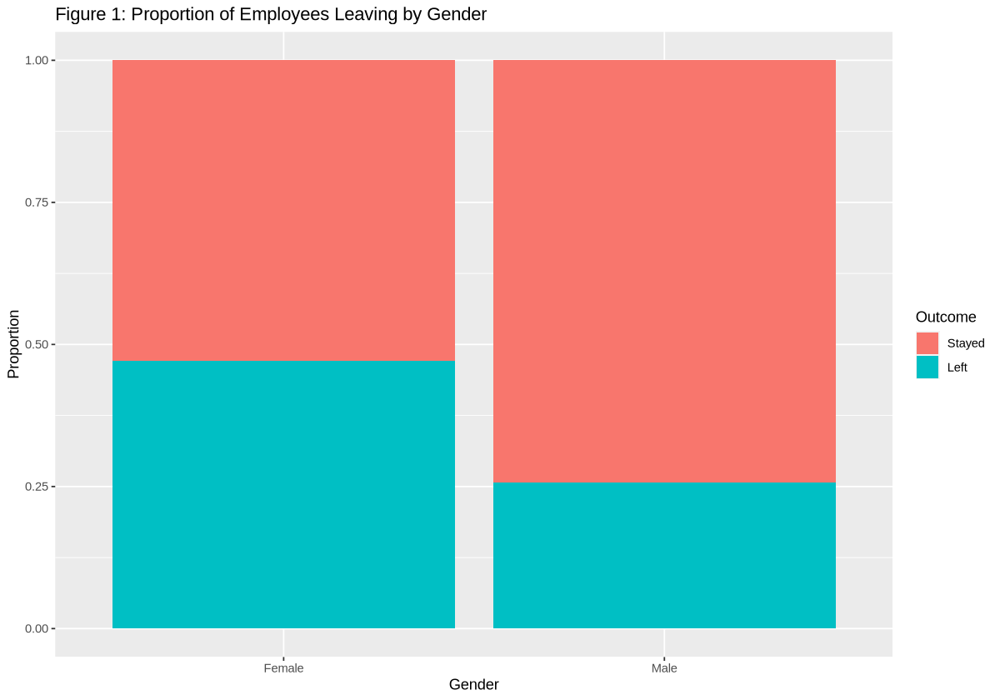

In [6]:
options(repr.plot.width = 10, repr.plot.height = 7)

figure1 <- ggplot(data, aes(x=Gender, fill=as.factor(LeaveOrNot))) + 
        geom_bar(position="fill") + 
        scale_fill_discrete(labels=c("Stayed", "Left")) + 
        labs(y="Proportion", fill="Outcome") + 
        ggtitle("Figure 1: Proportion of Employees Leaving by Gender")
figure1

Interestingly, we see that there's a difference in gender in the decision to leave the company. Theres an almost even split in women who decide to stay compared to women who leave, with a bit more women staying than leaving. Whereas in men, we see that almost 75% of the men stay and roughly 25% leave. This could suggest that women are more likely to leave compared to men. 

Now, we want to see if theres a relationship between an employee's decision to leave with age or years of experience. We will use boxplots to see the distribution of age and years of experience, seperated by employees who left and those who did not.

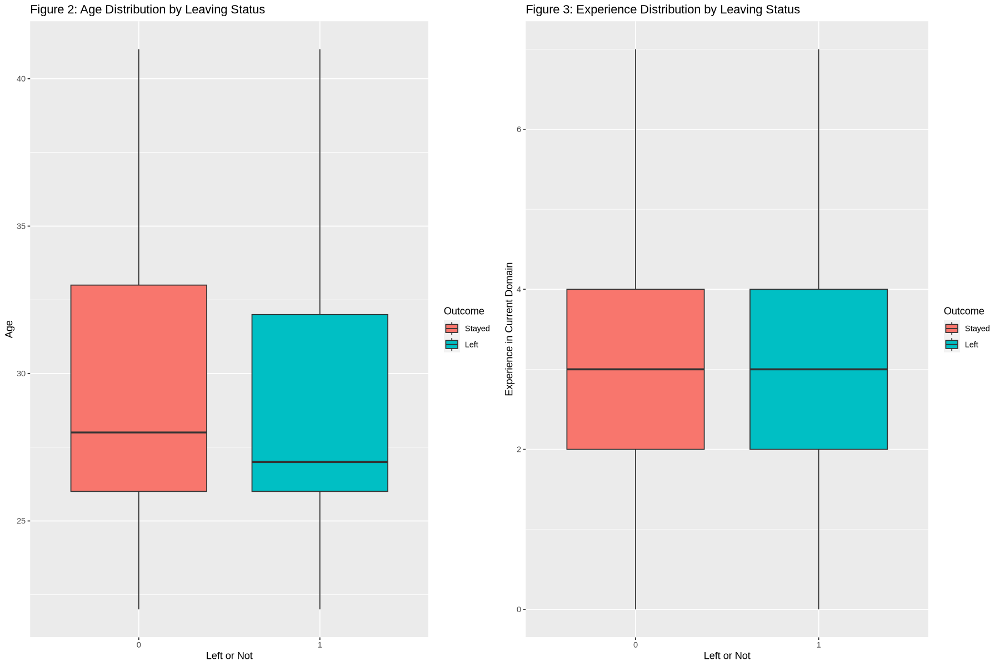

In [7]:
options(repr.plot.width = 15, repr.plot.height = 10)

figure2 <- ggplot(data, aes(x=as.factor(LeaveOrNot), y=Age, fill=as.factor(LeaveOrNot))) + 
        geom_boxplot() + 
        scale_fill_discrete(labels=c("Stayed", "Left")) + 
        labs(x="Left or Not", y="Age", fill="Outcome") + 
        ggtitle("Figure 2: Age Distribution by Leaving Status")
figure3 <- ggplot(data, aes(x=as.factor(LeaveOrNot), y=ExperienceInCurrentDomain, fill=as.factor(LeaveOrNot))) + 
        geom_boxplot() + 
        scale_fill_discrete(labels=c("Stayed", "Left")) + 
        labs(x="Left or Not", y="Experience in Current Domain", fill="Outcome") + 
        ggtitle("Figure 3: Experience Distribution by Leaving Status")

grid.arrange(figure2, figure3, ncol=2)

In figure 2, we see that the spread for those who stayed is bigger than those who left. It also looks like the distribution of those who left is more right-skewed than those who left. It could suggest that the younger employees are more likely to leave. In figure 3, we see the boxplots are identical, this could mean years of experience in the employee's field doesn't really correlate with an employee's decision to leave.

Finally, we want to see whether an employee's education level, employee's city they work in, and the salary tier of the employee plays a role to their decision on whether they leave or not. To do this, we will use grouped bar charts for each of the variables and split by whether they left or not. 

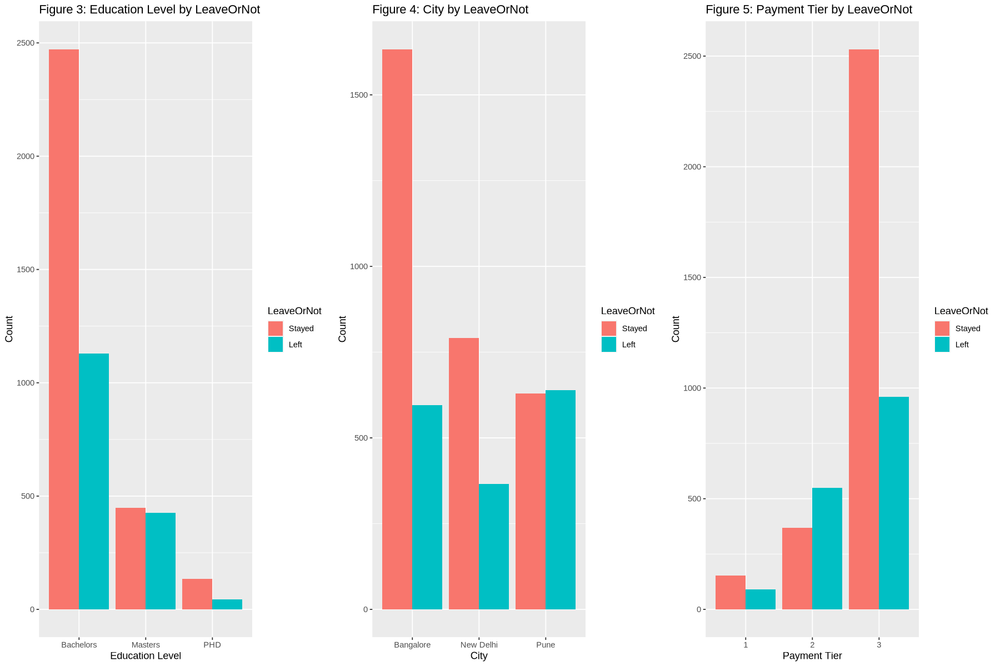

In [8]:
# Grouped Bar Charts for Education, City, Payment Tier by LeaveOrNot
figure3 <- ggplot(data, aes(x = Education, fill=LeaveOrNot)) +
        geom_bar(position = "dodge") +
        scale_fill_discrete(labels=c("Stayed", "Left")) + 
        labs(title = "Figure 3: Education Level by LeaveOrNot", x = "Education Level", y = "Count")

figure4 <- ggplot(data, aes(x = City, fill = LeaveOrNot)) +
        geom_bar(position = "dodge") +
        scale_fill_discrete(labels=c("Stayed", "Left")) + 
        labs(title = "Figure 4: City by LeaveOrNot", x = "City", y = "Count") 

figure5 <- ggplot(data, aes(x = PaymentTier, fill = LeaveOrNot)) +
        geom_bar(position = "dodge") +
        scale_fill_discrete(labels=c("Stayed", "Left")) + 
        labs(title = "Figure 5: Payment Tier by LeaveOrNot", x = "Payment Tier", y = "Count")

grid.arrange(figure3, figure4, figure5, ncol=3)

In figure 3, we see that the majority of employees who stayed with the company hold a Bachelor's degree, with those holding a Master's degree as the second largest group, followed by a smaller count of PhD holders. Similarly, among the employees who left, those with a Bachelor's degree also make up the largest group, but the proportion compared to Master's degree holders is greater than that of the staying group. This might suggest that holding a Bachelor's degree is common among all employees, but the likelihood of leaving might be relatively higher for Bachelor's degree holders compared to those with higher qualifications. Next, we see that Bangalore has the highest number of employees who stayed, which could indicate a larger workforce or better retention strategies in that location. New Delhi and Pune have similar counts for employees who stayed, but New Delhi has a slightly higher count of employees who left. This could imply location-specific factors that influence an employee's decision to leave, such as local job market conditions, living standards, or city-specific company policies. Lastly in figure 5, we see that Payment Tier 3 has a significantly higher count of employees who stayed compared to Tiers 1 and 2, with very few employees in Tier 3 leaving. Conversely, Payment Tier 1 has a relatively high count of employees who left, indicating that lower payment tiers might be associated with higher turnover. This could suggest that higher paid employees are more likely to stay in the company. Overall, these bar graphs seem to suggest some relationship between these variables and an employee's decision to leave.


Lastly, we want to graph a pairplot to fully visualize the distribution of all the variables.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwid

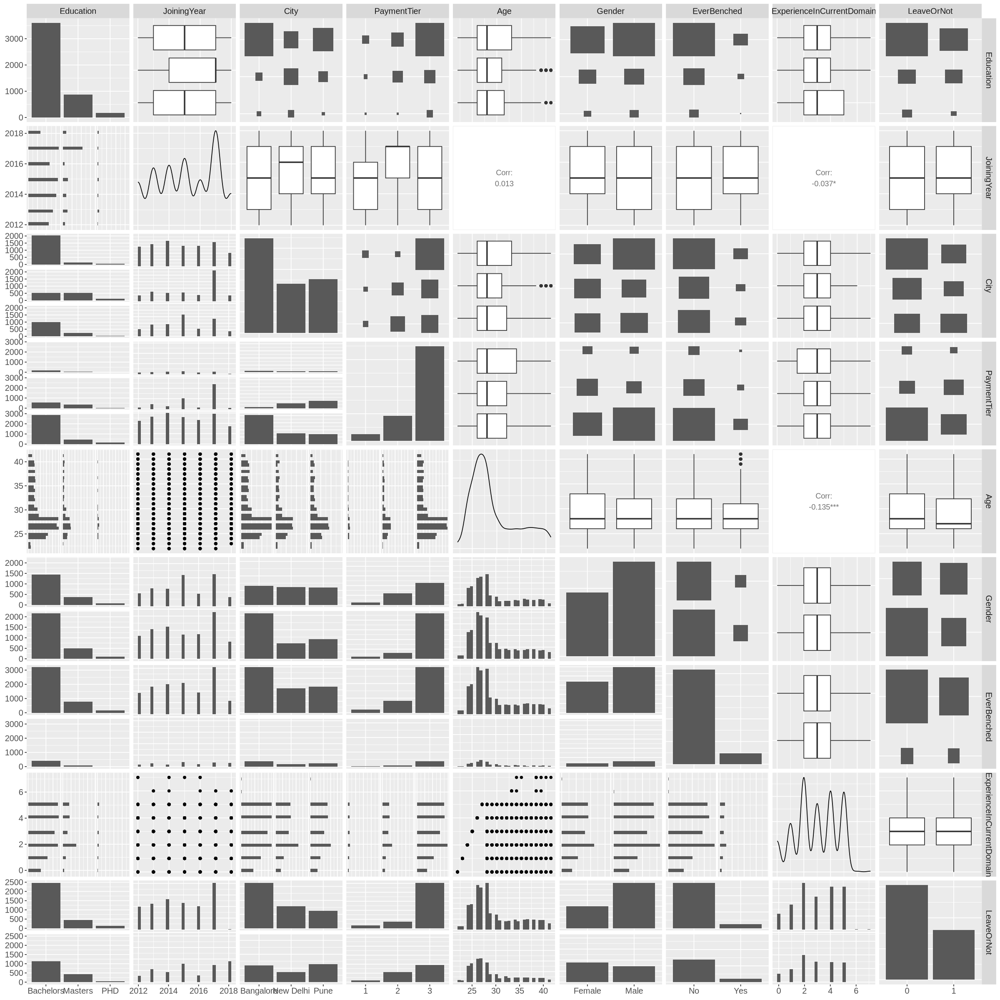

In [9]:
options(repr.plot.width = 20, repr.plot.height = 20)


pair_plots <- data %>%
  ggpairs(progress = FALSE) +
  theme(
    text = element_text(size = 15),
    plot.title = element_text(face = "bold"),
    axis.title = element_text(face = "bold")
  )
pair_plots

Most notably in this pairwise plot we see that majority of the workforce is relatively young, which is reflected in the 'Age' distribution. We also see that most employees are in the tier, as seen in the 'PaymentTier' distribution. Furthermore, the 'Education' distribution shows a predominance of Bachelor's degree holders, with a small number of PhD holders. Lastly, the variability in 'Experience in Current Domain' across 'Payment Tier' could indicate career progression within the company, with those in higher tiers typically having more experience, although the negative correlation suggests that this isn't always the case. 

The exploratory data analysis seems to suggest that the explanatory variables age, gender, educational background, city and payment tier are correlated with the response variable LeaveOrNot and could provide insightful analysis into an employee's decision on leaving the company.

## Methods 

To answer our question, we will follow these steps. 

**1. Data Splitting:**

- Divide the dataset into training (70%) and testing (30%) sets using a stratified sampling approach to maintain the proportion of the outcome variable across both sets. This ensures that both the training and testing datasets are representative of the overall data.

**2. Variable Selection:**

* Backward Selection: Start with a full model including all predictors and iteratively remove the least significant variable based on p-values and AIC until no further reduction in AIC is observed.
* LASSO (Least Absolute Shrinkage and Selection Operator): Implement LASSO regression to enforce regularization, which helps in reducing overfitting and selecting relevant variables. Use cross-validation to find the optimal lambda value that minimizes the AIC and identifies a subset of predictors with non-zero coefficients.

**3. Fit two logistic regression models for prediction:**

* Model from Backward Selection: Use the predictors selected by backward selection with the lowest AIC.
* Model from LASSO: Use the predictors identified by LASSO with the lambda that minimizes AUC.

**4. Model Selection with AUC:**

* Evaluate both models using the Area Under the ROC Curve (AUROC) metric on the testing data to assess their ability to discriminate between the classes accurately.
* Select the model that shows the highest AUROC as the final model for deeper analysis.

**5. Performance Evaluation:**

* Use the chosen model to predict employee turnover on the testing set.
* Plot ROC curve and obtain the AUROC for the chosen model
* Plot PRC curve and obtain the AUPRC for the chosen model
* Create a confusion matrix and obtain accuracy, sensitivity, specificity, precision, accuracy, and Cohen's Kappa scores.

Our chosen methods, logistic regression and variable selection through LASSO and backward selection, offer a powerful combination for analyzing our binary outcome variable "LeaveOrNot." Logistic regression's strength lies in its ability to handle diverse data types (numerical and categorical) and provide interpretable results for understanding employee turnover predictions. The variable selection techniques address potential issues with high-dimensional data. LASSO tackles overfitting by selecting relevant variables and applying regularization, while backward selection systematically removes the least significant ones, ensuring model complexity doesn't overshadow predictive power.

However, it's crucial to acknowledge limitations. LASSO assumes linearity between variables and relies heavily on tuning the regularization parameter. Additionally, both methods have limitations. LASSO may introduce bias in coefficient estimations, and backward selection assumes the initial full model captures all relevant interactions, which might not always be true. Despite these limitations, the combination of these techniques provides a robust framework for identifying the most significant factors influencing employee turnover.

Combining LASSO for feature selection and logistic regression for prediction offers a robust framework. This approach leverages the strengths of both methods. This methodology will offer a balanced and informative approach to analyzing employee turnover data.  

## Implementation

First we divide the data into 70% for training and 30% for testing, such proportions were carefully chosen to ensure enough data for robust model training while still leaving a substantial amount for testing. The data splitting included a randomization process to avoid any potential order effects that might bias the training or testing datasets. This is achieved by random shuffling of data points before the split, usually controlled by setting a random seed for reproducibility.

In [10]:
set.seed(1)

data$id <- 1:nrow(data)

data_train <- 
    data %>% 
    slice_sample(prop = 0.7)

data_test <- 
    data %>% 
    anti_join(data_train, by = "id")

data_train <-
    data_train %>%
    dplyr::select(-id)

data_test <-
    data_test %>%
    dplyr::select(-id)

head(data_train)

,Education,JoiningYear,City,PaymentTier,Age,Gender,EverBenched,ExperienceInCurrentDomain,LeaveOrNot
,<fct>,<int>,<fct>,<fct>,<int>,<fct>,<chr>,<int>,<fct>
1,Bachelors,2014,Bangalore,3,25,Female,No,3,0
2,Masters,2016,New Delhi,3,28,Female,No,2,0
3,Bachelors,2012,Pune,2,27,Female,No,5,1
4,Bachelors,2014,Bangalore,3,24,Male,No,2,0
5,Bachelors,2013,Bangalore,1,28,Female,No,1,0
6,Bachelors,2018,Bangalore,3,26,Female,No,4,1


We will first perform backward selection, we used the stepAIC function to perform backward selection for us. This function uses a stepwise algorithm to identify the best subset of predictor variables for a given model. It works by starting with an empty set of predictors and then adding or removing predictors one at a time, based on their AIC score.

In [11]:
set.seed(1004)


full_model <- glm(LeaveOrNot ~ ., data = data_train, family = binomial)


step.model <- stepAIC(full_model, direction = "backward")

Start:  AIC=3674.15
LeaveOrNot ~ Education + JoiningYear + City + PaymentTier + Age + 
    Gender + EverBenched + ExperienceInCurrentDomain

                            Df Deviance    AIC
<none>                           3650.1 3674.1
- ExperienceInCurrentDomain  1   3653.0 3675.0
- Age                        1   3657.0 3679.0
- EverBenched                1   3676.1 3698.1
- Education                  2   3691.7 3711.7
- JoiningYear                1   3702.6 3724.6
- PaymentTier                2   3706.0 3726.0
- City                       2   3746.4 3766.4
- Gender                     1   3766.4 3788.4


In [12]:
summary(step.model)


Call:
glm(formula = LeaveOrNot ~ Education + JoiningYear + City + PaymentTier + 
    Age + Gender + EverBenched + ExperienceInCurrentDomain, family = binomial, 
    data = data_train)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-2.0686  -0.8187  -0.6151   1.0115   2.2858  

Coefficients:
                            Estimate Std. Error z value Pr(>|z|)    
(Intercept)               -3.299e+02  4.605e+01  -7.163 7.87e-13 ***
EducationMasters           7.259e-01  1.142e-01   6.359 2.03e-10 ***
EducationPHD               8.057e-03  2.368e-01   0.034  0.97285    
JoiningYear                1.638e-01  2.286e-02   7.166 7.73e-13 ***
CityNew Delhi             -5.660e-01  1.180e-01  -4.795 1.63e-06 ***
CityPune                   5.693e-01  1.028e-01   5.537 3.08e-08 ***
PaymentTier2               7.881e-01  1.924e-01   4.096 4.20e-05 ***
PaymentTier3              -3.161e-02  1.757e-01  -0.180  0.85728    
Age                       -2.233e-02  8.590e-03  -2.599  0.00935 

In [13]:
print(paste("Features in Backward Selection: ", length(coef(step.model))))

[1] "Features in Backward Selection:  12"


Based on the results, backward selection has selected all the variables for the model. However, since this is a regression model, categorical variables with more than two levels were split into dummy variables so there are 11 explanatory variables included in the model not including the intercept. 

Next, we will perform LASSO, selecting the optimal lambda through cross-validation aimed at maximizing the Area Under the ROC Curve (AUC) for predictive accuracy. We chose $\hat{\lambda}_{\text{1SE}}$ because it allows us to select a simpler, more interpretable model without significantly reducing AUC. Cross validation is done to ensure that the lambda value selected for the LASSO model provides a robust estimate of the model's performance on unseen data.

In [14]:
### perform LASSO

set.seed(203)

model_matrix_X_train <- 
    model.matrix(object=LeaveOrNot~., data=data_train)
model_matrix_X_train <- model_matrix_X_train[, !colnames(model_matrix_X_train) %in% c("(Intercept)", "LeaveOrNot")]


matrix_Y_train <- 
    as.matrix(data_train$LeaveOrNot, ncol = 1)

In [15]:
set.seed(304)

cv_lambda_LASSO <- 
  cv.glmnet(
  x = model_matrix_X_train, y = matrix_Y_train,
  alpha = 1,
  family = "binomial",
  type.measure = "auc",
  nfolds = 5)

cv_lambda_LASSO


Call:  cv.glmnet(x = model_matrix_X_train, y = matrix_Y_train, type.measure = "auc",      nfolds = 5, alpha = 1, family = "binomial") 

Measure: AUC 

      Lambda Index Measure       SE Nonzero
min 0.001377    50  0.7377 0.007862      10
1se 0.016975    23  0.7300 0.008282       8

In [16]:
lambda_1se_AUC_LASSO <- round(cv_lambda_LASSO$lambda.1se, 4)

lambda_1se_AUC_LASSO

[1] 0.017

In [17]:
set.seed(1234)

LASSO_1se_AUC <- glmnet(
  x = model_matrix_X_train, y = matrix_Y_train,
  alpha = 1,
  family = "binomial",
  lambda = lambda_1se_AUC_LASSO
)

LASSO_1se_AUC

coef(LASSO_1se_AUC)


Call:  glmnet(x = model_matrix_X_train, y = matrix_Y_train, family = "binomial",      alpha = 1, lambda = lambda_1se_AUC_LASSO) 

  Df  %Dev Lambda
1  8 11.75  0.017

12 x 1 sparse Matrix of class "dgCMatrix"
                                     s0
(Intercept)               -2.347640e+02
EducationMasters           4.047997e-01
EducationPHD               .           
JoiningYear                1.161886e-01
CityNew Delhi             -1.776793e-01
CityPune                   5.292696e-01
PaymentTier2               7.046147e-01
PaymentTier3               .           
Age                       -5.911384e-04
GenderMale                -6.805887e-01
EverBenchedYes             3.731604e-01
ExperienceInCurrentDomain  .           

Based on our results, LASSO has chosen the predictors `EducationMasters`, `JoiningYear`, `CityDelhi`, `CityPune`, `PaymentTier2`, `Age`, `GenderMale`, and `EverBenchedYes` for the model. Similar to backward selection, the categorical variables were split into dummy variables hence why there are 8 explanatory variables in our model not including the intercept. 

In [18]:
print(paste("Features in LASSO: ", sum(coef(LASSO_1se_AUC) != 0)))

[1] "Features in LASSO:  9"


In [19]:
# Evaluation metrics
set.seed(123)


# Predictions for backward selection model
predictions_backward <- predict(step.model, newdata = data_test, type = "response")
roc_backward <- roc(data_test$LeaveOrNot, predictions_backward)
auc_backward <- auc(roc_backward)

# Predictions for LASSO model
model_matrix_X_test <- 
    model.matrix(object = LeaveOrNot~.,
                 data = data_test)[, -1]

predictor_LASSO <- predict(LASSO_1se_AUC, newx = model_matrix_X_test)[,"s0"] 
roc_lasso <- 
    roc(
        response = data_test$LeaveOrNot,
        predictor = predictor_LASSO) 
auc_lasso <- auc(roc_lasso)

# Compare AUC, and possibly other metrics
print(paste("AUROC for Backward Selection: ", auc_backward))
print(paste("AUROC for LASSO: ", auc_lasso))

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "AUROC for Backward Selection:  0.738990638990639"
[1] "AUROC for LASSO:  0.725201239090128"


Based on the AUC, backward selection seems to be the better performing model so we will choose the backward selection model.  

### Results

Our model includes all the explanatory variables as our predictors and we obtained an AUROC of around 0.725. The AUROC value of 0.725 suggests that the model has a good ability to discriminate between the positive class and the negative class. An AUC value of 0.5 indicates no discriminative ability equal to guessing, while a value of 1.0 indicates perfect discrimination. This indicates that the model performs significantly better than random but is not close to perfect. Next, we will plot the AUROC.

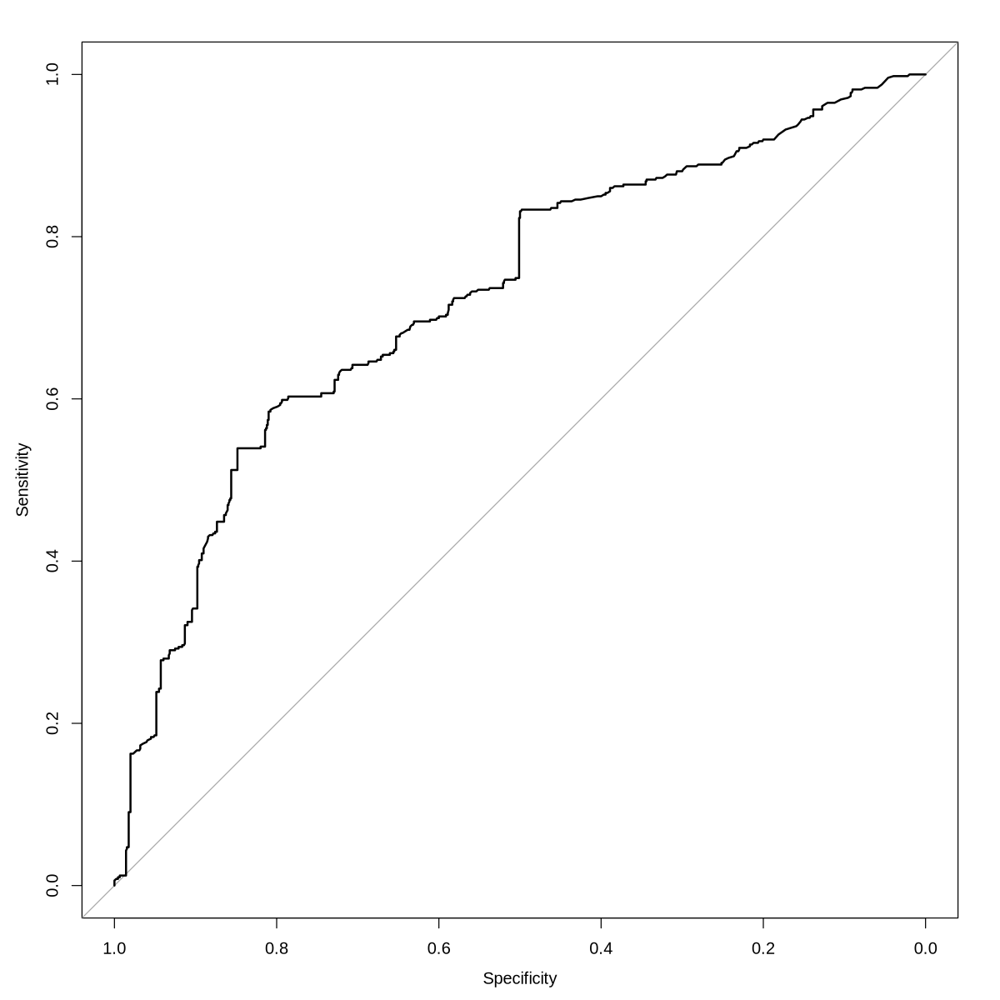

In [20]:
options(repr.plot.width = 10, repr.plot.height = 10)

plot(roc_lasso)

The AUROC curve demonstrates a model with good predictive performance, substantially better than random guessing, indicated by the curve's position above the diagonal line of no discrimination. The step-like pattern of the curve suggests that the model may have been trained on a smaller dataset or that the predictions are made with certain thresholds, causing this granularity. While the model is capable of distinguishing between the classes, there is potential for enhancement, possibly by refining the model or by employing additional relevant features. Given the space above the curve, there could be possible improvements done to yield a higher AUC.

Next, we want to get the PRC and AUPRC of the model. It is useful when class distribution is imbalanced. A higher AUPRC indicates both high recall and high precision, a perfect model will give a AUPRC OF 1. This is relevant since the number of employees in our dataset that leaves is much smaller than the number of employees that stay.

In [42]:
# Extract labels for clarity
labels <- data_test$LeaveOrNot

# Calculate AUC-PRC and PR curve
prc_backward <- pr.curve(predictions_backward, labels, curve=TRUE)
prc_backward


  Precision-recall curve

    Area under curve (Integral):
     0.528663 

    Area under curve (Davis & Goadrich):
     0.5286628 

    Curve for scores from  0  to  1 
    ( can be plotted with plot(x) )


The calculated AUPRC of approximately 0.528 suggests that the model has room for improvement in predicting employee departures. An AUPRC this close to 0.5, which represents random guessing, indicates the model's limited ability to differentiate between employees who will leave and those who will stay. In other words, the model is only slightly better than flipping a coin in predicting employee churn

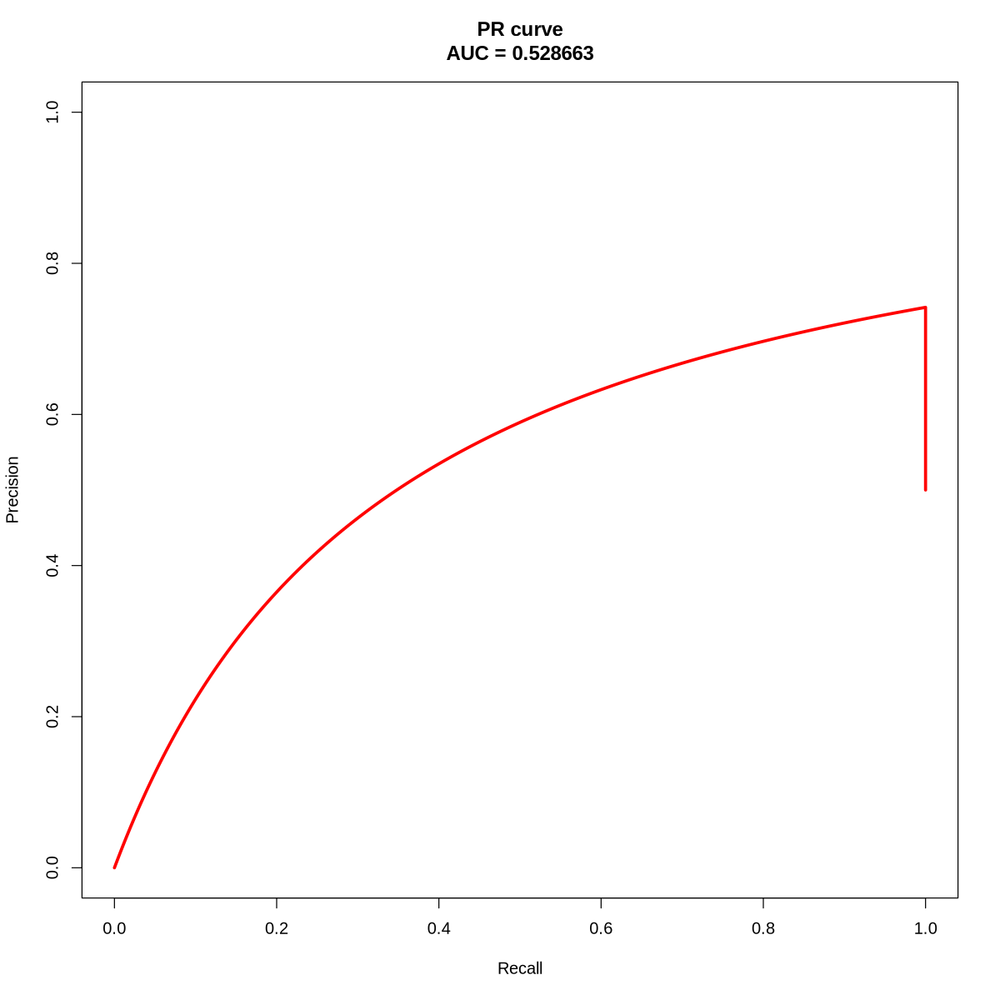

In [43]:
plot(prc_backward, color="red")

In [29]:
# Convert probabilities to binary predictions
binary_predictions_backward <- ifelse(predictions_backward > 0.5, 1, 0)

# Actual responses
actual_responses <- data_test$LeaveOrNot

# Confusion matrix for the backward selection model
conf_matrix_backward <- confusionMatrix(as.factor(binary_predictions_backward), as.factor(actual_responses))
print(conf_matrix_backward)

Confusion Matrix and Statistics

          Reference
Prediction   0   1
         0 821 286
         1  89 200
                                          
               Accuracy : 0.7314          
                 95% CI : (0.7073, 0.7545)
    No Information Rate : 0.6519          
    P-Value [Acc > NIR] : 1.18e-10        
                                          
                  Kappa : 0.3464          
                                          
 Mcnemar's Test P-Value : < 2.2e-16       
                                          
            Sensitivity : 0.9022          
            Specificity : 0.4115          
         Pos Pred Value : 0.7416          
         Neg Pred Value : 0.6920          
             Prevalence : 0.6519          
         Detection Rate : 0.5881          
   Detection Prevalence : 0.7930          
      Balanced Accuracy : 0.6569          
                                          
       'Positive' Class : 0               
                              

Our model achieves an accuracy of 73.14%, indicating it makes correct predictions for roughly 73 out of every 100 cases. However, accuracy can be deceptive. While the model excels at identifying true positives (sensitivity of 90.22%), it struggles with true negatives (specificity of 41.15%). This means the model frequently misclassifies negative cases as positive, leading to a high rate of false positives. Although the model has decent precision (74.15%), meaning its positive predictions are usually correct, we see that our model is quite weak when handling negative cases. In the context of our research question, If we were to layoff or hire employees based on our predictions we might end up with significant operational disruptions and potential costs associated with these incorrect decisions.

## Discussion 